In [13]:
import easyocr
import re
def extract_passport_data(image_path):
    # Initialize the EasyOCR reader
    reader = easyocr.Reader(['en'])

    # Perform OCR on the passport image
    results = reader.readtext(image_path)
    print("Raw OCR Results:", results)

    # Dictionary to store extracted data
    passport_data = {
        "Passport Number": "",
        "Surname": "",
        "Given Name(s)": "",
        "Nationality": "",
        "Date of Birth": "",
        "Sex": "",
        "Place of Birth": "",
        "Date of Issue": "",
        "Date of Expiry": "",
        "Holder's Signature": "",
    }

    # Parse the results
    for _, text, _ in results:
        if "Passport No" in text or "Passport Number" in text:
            passport_data["Passport Number"] = re.sub(r'[^\w\s]', '', text.split(":")[-1]).strip()
        elif "Surname" in text:
            passport_data["Surname"] = text.replace("Surname", "").replace(":", "").strip()
        elif "Given Name" in text or "Given Names" in text:
            passport_data["Given Name(s)"] = text.replace("Given Names", "").replace("Given Name", "").replace(":", "").strip()
        elif "Nationality" in text:
            passport_data["Nationality"] = text.replace("Nationality", "").replace(":", "").strip()
        elif "Date of Birth" in text:
            passport_data["Date of Birth"] = text.replace("Date of Birth", "").replace(":", "").strip()
        elif "Sex" in text:
            passport_data["Sex"] = text.replace("Sex", "").replace(":", "").strip()
        elif "Place of Birth" in text:
            passport_data["Place of Birth"] = text.replace("Place of Birth", "").replace(":", "").strip()
        elif "Date of Issue" in text:
            passport_data["Date of Issue"] = text.replace("Date of Issue", "").replace(":", "").strip()
        elif "Date of Expiry" in text:
            passport_data["Date of Expiry"] = text.replace("Date of Expiry", "").replace(":", "").strip()
        elif "Holder's Signature" in text:
            passport_data["Holder's Signature"] = text.replace("Holder's Signature", "").replace(":", "").strip()

# Print the extracted data
    for key, value in passport_data.items():
        print(f"{key}: {value}")

    return passport_data

# Example usage
image_path = 'pass_layout.jpg'
extracted_data = extract_passport_data(image_path)

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


Raw OCR Results: [([[np.int32(888), 0], [np.int32(922), 0], [np.int32(922), np.int32(28)], [np.int32(888), np.int32(28)]], '', np.float64(0.0)), ([[np.int32(206), np.int32(224)], [np.int32(232), np.int32(224)], [np.int32(232), np.int32(332)], [np.int32(206), np.int32(332)]], '1', np.float64(0.2156256969029693)), ([[np.int32(208), np.int32(338)], [np.int32(232), np.int32(338)], [np.int32(232), np.int32(368)], [np.int32(208), np.int32(368)]], '3', np.float64(0.2547919513733774)), ([[np.int32(305), np.int32(510)], [np.int32(535), np.int32(510)], [np.int32(535), np.int32(536)], [np.int32(305), np.int32(536)]], 'INTERNATIONAL', np.float64(0.9902693255998192)), ([[np.int32(544), np.int32(510)], [np.int32(694), np.int32(510)], [np.int32(694), np.int32(536)], [np.int32(544), np.int32(536)]], 'PASSPORT', np.float64(0.99981332439047)), ([[np.int32(427), np.int32(545)], [np.int32(469), np.int32(545)], [np.int32(469), np.int32(559)], [np.int32(427), np.int32(559)]], 'TYPE', np.float64(0.6698578596

In [ ]:
results = reader.readtext(image_path)
print("Raw OCR Results:", results)


In [6]:
import easyocr
import numpy as np

def extract_passport_data(image_path):
    # Initialize the EasyOCR reader (gpu=True if available)
    reader = easyocr.Reader(['en'], gpu=True)
    
    # Read the image and extract OCR results: a list of tuples (bbox, text, confidence)
    results = reader.readtext(image_path)
    
    # Print raw OCR results for debugging
    print("Raw OCR Results:", results)
    
    # Dictionary to store labeled fields and extracted data with their confidence scores.
    # Each key maps to a tuple: (value, confidence)
    passport_data = {
        'Document Type': ('', 0),
        'Surname': ('', 0),
        'Given Name(s)': ('', 0),
        'Nationality': ('', 0),
        'Date of Birth': ('', 0),
        'Sex': ('', 0),
        'Place of Birth': ('', 0),
        'Date of Issue': ('', 0),
        'Date of Expiry': ('', 0),
        "Holder's Signature": ('', 0),
        'Passport Number': ('', 0)
    }
    
    # Helper function to clean text by removing the label and extra characters.
    def clean_text(text, keyword):
        return text.replace(keyword, "").replace(":", "").strip()
    
    # Loop over the OCR results with index to allow "lookahead" for values.
    for idx, (bbox, text, prob) in enumerate(results):
        t = text.strip().upper()
        
        # Document Type: if 'PASSPORT' is in text, update if not already set.
        if "PASSPORT" in t and passport_data['Document Type'][0] == '':
            passport_data['Document Type'] = (t, prob)
        
        # Surname: Sometimes OCR may output 'BURNAME' instead of 'SURNAME'
        if ("SURNAME" in t or "BURNAME" in t) and passport_data['Surname'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Surname'] = (next_text, next_prob)
            else:
                passport_data['Surname'] = (clean_text(t, "SURNAME"), prob)
        
        # Given Name(s): handle both "GIVEN NAME" and "GIVEN NAMES"
        if ("GIVEN NAME" in t or "GIVEN NAMES" in t) and passport_data['Given Name(s)'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Given Name(s)'] = (next_text, next_prob)
            else:
                passport_data['Given Name(s)'] = (clean_text(t, "GIVEN NAMES"), prob)
        
        # Nationality:
        if "NATIONALITY" in t and passport_data['Nationality'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Nationality'] = (next_text, next_prob)
            else:
                passport_data['Nationality'] = (clean_text(t, "NATIONALITY"), prob)
        
        # Date of Birth:
        if "DATE OF BIRTH" in t and passport_data['Date of Birth'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Date of Birth'] = (next_text, next_prob)
            else:
                passport_data['Date of Birth'] = (clean_text(t, "DATE OF BIRTH"), prob)
        
        # Sex:
        if "SEX" in t and passport_data['Sex'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Sex'] = (next_text, next_prob)
            else:
                passport_data['Sex'] = (clean_text(t, "SEX"), prob)
        
        # Place of Birth:
        if "PLACE" in t and "BIRTH" in t and passport_data['Place of Birth'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Place of Birth'] = (next_text, next_prob)
            else:
                passport_data['Place of Birth'] = (clean_text(t, "PLACE OF BIRTH"), prob)
        
        # Date of Issue:
        if "DATE" in t and "ISSUE" in t and passport_data['Date of Issue'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Date of Issue'] = (next_text, next_prob)
            else:
                passport_data['Date of Issue'] = (clean_text(t, "DATE OF ISSUE"), prob)
        
        # Date of Expiry:
        if "DATE" in t and "EXPI" in t and passport_data['Date of Expiry'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Date of Expiry'] = (next_text, next_prob)
            else:
                passport_data['Date of Expiry'] = (clean_text(t, "DATE OF EXPIRY"), prob)
        
        # Passport Number:
        if ("PASSPORT NO" in t or "PASSPORT NUMBER" in t) and passport_data['Passport Number'][0] == '':
            if idx + 1 < len(results):
                next_text = results[idx + 1][1].strip()
                next_prob = results[idx + 1][2]
                passport_data['Passport Number'] = (next_text, next_prob)
            else:
                passport_data['Passport Number'] = (clean_text(t, "PASSPORT NO"), prob)
        
        # Holder's Signature:
        if "SIGNATURE" in t and passport_data["Holder's Signature"][0] == '':
            passport_data["Holder's Signature"] = ("Signature field detected (image region)", prob)
    
    # Print the final extracted fields along with their confidence scores.
    for field, (value, conf) in passport_data.items():
        print(f"{field}: {value} (Confidence: {conf:.2f})")
    
    return passport_data

# Example usage:
if __name__ == "__main__":
    image_path = 'pass_layout.jpg'
    extracted_data = extract_passport_data(image_path)


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


Raw OCR Results: [([[np.int32(888), 0], [np.int32(922), 0], [np.int32(922), np.int32(28)], [np.int32(888), np.int32(28)]], '', np.float64(0.0)), ([[np.int32(206), np.int32(224)], [np.int32(232), np.int32(224)], [np.int32(232), np.int32(332)], [np.int32(206), np.int32(332)]], '1', np.float64(0.2156256969029693)), ([[np.int32(208), np.int32(338)], [np.int32(232), np.int32(338)], [np.int32(232), np.int32(368)], [np.int32(208), np.int32(368)]], '3', np.float64(0.2547919513733774)), ([[np.int32(305), np.int32(510)], [np.int32(535), np.int32(510)], [np.int32(535), np.int32(536)], [np.int32(305), np.int32(536)]], 'INTERNATIONAL', np.float64(0.9902693255998192)), ([[np.int32(544), np.int32(510)], [np.int32(694), np.int32(510)], [np.int32(694), np.int32(536)], [np.int32(544), np.int32(536)]], 'PASSPORT', np.float64(0.99981332439047)), ([[np.int32(427), np.int32(545)], [np.int32(469), np.int32(545)], [np.int32(469), np.int32(559)], [np.int32(427), np.int32(559)]], 'TYPE', np.float64(0.6698578596

In [5]:
import cv2
import easyocr

def visualize_ocr(image_path):
    # Initialize the EasyOCR reader
    reader = easyocr.Reader(['en'], gpu=True)
    
    # Read image and get OCR results (bounding boxes, text, and confidence)
    results = reader.readtext(image_path)
    
    # Load the image using OpenCV
    image = cv2.imread(image_path)
    
    # Loop through results and draw bounding boxes
    for (bbox, text, prob) in results:
        # Extract the four points of the bounding box and convert to int
        bbox = [tuple(map(int, point)) for point in bbox]
        # Draw the bounding box (blue rectangle, thickness=2)
        cv2.polylines(image, [np.array(bbox)], isClosed=True, color=(255, 0, 0), thickness=2)
        # Put recognized text near the box (green text)
        cv2.putText(image, text, (bbox[0][0], bbox[0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    # Display the image with bounding boxes
    cv2.imshow("OCR Bounding Boxes", image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage:
if __name__ == "__main__":
    import numpy as np  # Ensure numpy is imported
    image_path = 'pass_layout.jpg'
    visualize_ocr(image_path)


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


error: OpenCV(4.11.0) D:\a\opencv-python\opencv-python\opencv\modules\highgui\src\window.cpp:1301: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'


Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


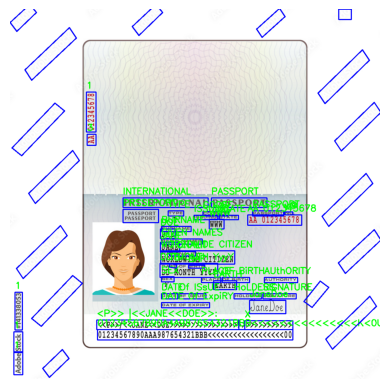

In [7]:
import cv2
import easyocr
import matplotlib.pyplot as plt
import numpy as np

def visualize_ocr(image_path):
    # Initialize the EasyOCR reader
    reader = easyocr.Reader(['en'], gpu=True)
    
    # Read image and get OCR results (bounding boxes, text, and confidence)
    results = reader.readtext(image_path)
    
    # Load the image using OpenCV
    image = cv2.imread(image_path)
    
    # Loop through results and draw bounding boxes
    for (bbox, text, prob) in results:
        # Extract the four points of the bounding box and convert to int
        bbox = [tuple(map(int, point)) for point in bbox]
        # Draw the bounding box (blue rectangle, thickness=2)
        cv2.polylines(image, [np.array(bbox)], isClosed=True, color=(255, 0, 0), thickness=2)
        # Put recognized text near the box (green text)
        cv2.putText(image, text, (bbox[0][0], bbox[0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    # Convert the image from BGR to RGB for matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Display the image using matplotlib
    plt.imshow(image_rgb)
    plt.axis('off')  # Hide axes
    plt.show()

# Example usage:
if __name__ == "__main__":
    image_path = 'pass_layout.jpg'
    visualize_ocr(image_path)

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


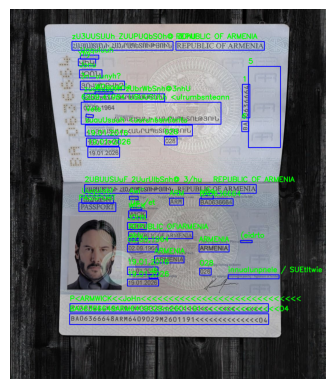

In [3]:
import cv2
import easyocr
import matplotlib.pyplot as plt
import numpy as np

def visualize_ocr(image_path):
    # Initialize the EasyOCR reader
    reader = easyocr.Reader(['en'], gpu=True)
    
    # Read image and get OCR results (bounding boxes, text, and confidence)
    results = reader.readtext(image_path)
    
    # Load the image using OpenCV
    image = cv2.imread(image_path)
    
    # Loop through results and draw bounding boxes
    for (bbox, text, prob) in results:
        # Extract the four points of the bounding box and convert to int
        bbox = [tuple(map(int, point)) for point in bbox]
        # Draw the bounding box (blue rectangle, thickness=2)
        cv2.polylines(image, [np.array(bbox)], isClosed=True, color=(255, 0, 0), thickness=2)
        # Put recognized text near the box (green text)
        cv2.putText(image, text, (bbox[0][0], bbox[0][1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

    # Convert the image from BGR to RGB for matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Display the image using matplotlib
    plt.imshow(image_rgb)
    plt.axis('off')  # Hide axes
    plt.show()

# Example usage:
if __name__ == "__main__":
    image_path = 'passport_images\Armenia Passport-1.jpg'
    visualize_ocr(image_path)

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


OCR Results:
ID    Bounding Box Coordinates       Confidence      Text
--------------------------------------------------------------------------------
0     [(194, 194), (218, 194), (218, 242), (194, 242)] 0.91            2
1     [(498, 190), (528, 190), (528, 276), (498, 276)] 0.08            5
2     [(194, 237), (222, 237), (222, 320), (194, 320)] 0.23            1
3     [(230, 268), (254, 268), (254, 298), (230, 298)] 0.13            5
4     [(174, 358), (268, 358), (268, 432), (174, 432)] 0.14            SEF
5     [(458, 277), (536, 277), (536, 436), (458, 436)] 0.17            1
6     [(800, 218), (862, 218), (862, 451), (800, 451)] 0.05            4
7     [(211, 399), (272, 399), (272, 477), (211, 477)] 0.18            TI
8     [(504, 436), (534, 436), (534, 480), (504, 480)] 0.84            9
9     [(458, 660), (486, 660), (486, 668), (458, 668)] 0.00            UeO
10    [(553, 657), (593, 657), (593, 671), (553, 671)] 0.15            counge
11    [(613, 657), (647, 657), (647

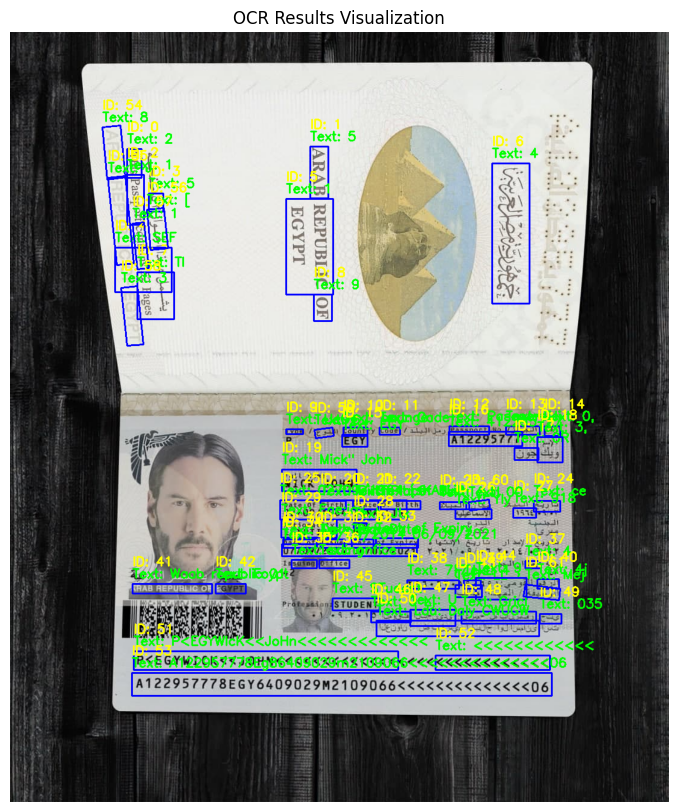

In [4]:
import cv2
import easyocr
import matplotlib.pyplot as plt
import numpy as np

def visualize_ocr_with_details(image_path):
    # Initialize the EasyOCR reader
    reader = easyocr.Reader(['en'], gpu=True)
    
    # Read image and get OCR results
    results = reader.readtext(image_path)
    
    # Load the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Print header
    print("OCR Results:")
    print("{:<5} {:<30} {:<15} {}".format("ID", "Bounding Box Coordinates", "Confidence", "Text"))
    print("-" * 80)
    
    # Process each detection
    for idx, (bbox, text, prob) in enumerate(results):
        # Convert coordinates to integers
        bbox = [tuple(map(int, point)) for point in bbox]
        
        # Draw bounding box
        cv2.polylines(image, [np.array(bbox)], True, (255, 0, 0), 2)
        
        # Add ID and text annotations
        label_id = f"ID: {idx}"
        label_text = f"Text: {text}"
        
        # Put ID above the bounding box
        cv2.putText(image, label_id, (bbox[0][0], bbox[0][1] - 30), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 255), 2)
        
        # Put text below the ID
        cv2.putText(image, label_text, (bbox[0][0], bbox[0][1] - 10), 
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
        
        # Format coordinates for display
        coords = [tuple(point) for point in bbox]
        
        # Print to console
        print("{:<5} {:<30} {:<15.2f} {}".format(
            idx, 
            str(coords), 
            prob, 
            text
        ))

    # Display the image
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("OCR Results Visualization")
    plt.show()

# Example usage
if __name__ == "__main__":
    image_path = 'passport_images\Egypt Passport-1.jpg'
    visualize_ocr_with_details(image_path)

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


High Confidence OCR Results (confidence > 0.50):
ID    Coordinates                    Confidence      Text
----------------------------------------------------------------------
0     [(392, 196), (1072, 196), (1072, 222), (392, 222)] 0.73            THIS PAGE IS RESERVED FOR OFFICIAL OBSERVATIONS
1     [(426, 218), (1036, 218), (1036, 242), (426, 242)] 0.82            CETTE PAGE EST RESERVEE AUX OBSERVATIONS OFFICIELLES (H4)
2     [(365, 289), (443, 289), (443, 309), (365, 309)] 0.92            #THERE
3     [(451, 289), (491, 289), (491, 309), (451, 309)] 1.00            ARE
4     [(507, 899), (611, 899), (611, 919), (507, 919)] 0.88            PASSPORT
5     [(667, 915), (733, 915), (733, 931), (667, 931)] 0.84            TypefType
6     [(829, 913), (887, 913), (887, 929), (829, 929)] 0.73            Code Co
7     [(500, 922), (620, 922), (620, 946), (500, 946)] 1.00            PASSEPORT
8     [(669, 935), (689, 935), (689, 957), (669, 957)] 0.98            P
9     [(834, 934), (888

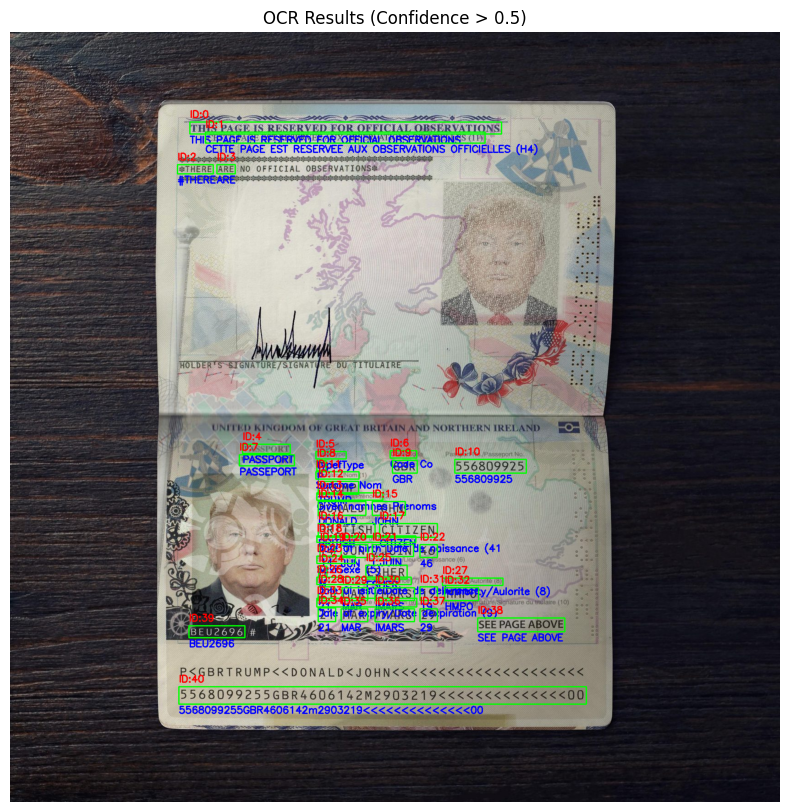

In [3]:

import cv2
import easyocr
import matplotlib.pyplot as plt
import numpy as np

def filter_high_confidence_ocr(image_path, confidence_threshold=0.2):
    # Initialize EasyOCR reader
    reader = easyocr.Reader(['en'], gpu=True)
    
    # Read image and get OCR results
    results = reader.readtext(image_path)
    
    # Load image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Create figure
    plt.figure(figsize=(15, 10))
    
    # Counter for valid bounding boxes
    box_id = 0
    
    # Print header
    print("High Confidence OCR Results (confidence > 0.50):")
    print("{:<5} {:<30} {:<15} {}".format("ID", "Coordinates", "Confidence", "Text"))
    print("-" * 70)
    
    for result in results:
        bbox, text, prob = result
        if prob > confidence_threshold:
            # Convert coordinates to integers
            top_left = tuple(map(int, bbox[0]))
            bottom_right = tuple(map(int, bbox[2]))
            
            # Draw rectangle
            cv2.rectangle(image, top_left, bottom_right, (0, 255, 0), 2)
            
            # Add ID and text annotations
            cv2.putText(image, f"ID:{box_id}", (top_left[0], top_left[1]-10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 0), 2)
            cv2.putText(image, text, (top_left[0], bottom_right[1]+20), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
            
            # Print to console
            print("{:<5} {:<30} {:<15.2f} {}".format(
                box_id,
                str([tuple(map(int, point)) for point in bbox]), 
                prob,
                text
            ))
            
            box_id += 1

    # Show image with bounding boxes
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"OCR Results (Confidence > {confidence_threshold})")
    plt.show()

# Example usage
if __name__ == "__main__":
    image_path = 'passport_images\Britain Passport-1.jpg'  # Update with your path
    filter_high_confidence_ocr(image_path, confidence_threshold=0.50)

C:\Users\atef nasri\AppData\Local\Temp\ipykernel_26108\3971647583.py:38: MatplotlibDeprecationWarning: Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.
  plt.hist(gray.ravel(), 256, [0, 256], color='gray')
C:\Users\atef nasri\AppData\Local\Temp\ipykernel_26108\3971647583.py:67: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\CCC_data_factory\CIN_validation_service\CIN_validation_service\venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128994 (\N{LARGE GREEN CIRCLE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


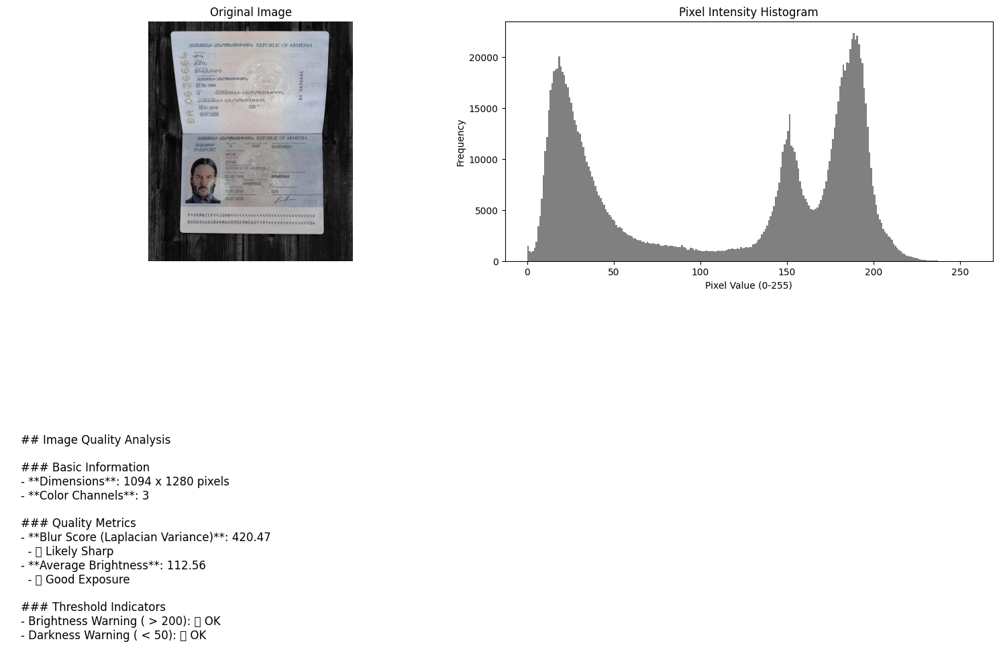

In [7]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

def analyze_image_quality(image_path):
    # Load image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return

    # Convert to RGB for display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Create figure
    plt.figure(figsize=(15, 10))
    
    # Display image
    plt.subplot(2, 2, 1)
    plt.imshow(image_rgb)
    plt.title('Original Image')
    plt.axis('off')

    # Calculate metrics
    # 1. Resolution
    height, width = image.shape[:2]
    
    # 2. Blur detection
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur_value = cv2.Laplacian(gray, cv2.CV_64F).var()
    
    # 3. Brightness analysis
    brightness = np.mean(gray)
    
    # 4. Histogram visualization
    plt.subplot(2, 2, 2)
    plt.hist(gray.ravel(), 256, [0, 256], color='gray')
    plt.title('Pixel Intensity Histogram')
    plt.xlabel('Pixel Value (0-255)')
    plt.ylabel('Frequency')
    
    # Create metrics display
    metrics_text = f"""
    ## Image Quality Analysis
    
    ### Basic Information
    - **Dimensions**: {width} x {height} pixels
    - **Color Channels**: {image.shape[2] if len(image.shape) == 3 else 1}
    
    ### Quality Metrics
    - **Blur Score (Laplacian Variance)**: {blur_value:.2f}
      - {'🟢 Likely Sharp' if blur_value > 100 else '🔴 Likely Blurry'}
    - **Average Brightness**: {brightness:.2f}
      - {'🟢 Good Exposure' if 50 <= brightness <= 200 else '🔴 Needs Adjustment'}
    
    ### Threshold Indicators
    - Brightness Warning ( > 200): {'🔴 Overexposed' if brightness > 200 else '🟢 OK'}
    - Darkness Warning ( < 50): {'🔴 Underexposed' if brightness < 50 else '🟢 OK'}
    """

    # Display metrics
    plt.subplot(2, 2, (3, 4))
    plt.text(0, 0.5, metrics_text, fontsize=12, va='top')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Usage example
analyze_image_quality('passport_images\Armenia Passport-1.jpg')

In [17]:
from passporteye import read_mrz
from dotenv import load_dotenv
import os
import pytesseract

# Load environment variables from the .env file
load_dotenv()

# Set the Tesseract command path from the environment variable
tesseract_cmd = os.getenv("TESSERACT_CMD")
if not tesseract_cmd:
    raise Exception("TESSERACT_CMD is not set in the .env file. Please define the path to Tesseract.")

# Configure pytesseract to use the specified Tesseract executable
pytesseract.pytesseract.tesseract_cmd = tesseract_cmd

# Process the passport image
image_path = "passport_images\Venezuela Passport-1.jpg"  # Ensure correct path format for your OS

if not os.path.exists(image_path):
    raise FileNotFoundError(f"The specified image file does not exist: {image_path}")

# Use PassportEye to extract MRZ (Machine Readable Zone) data
mrz = read_mrz(image_path)

# Check if MRZ data was successfully extracted
if mrz:
    print("MRZ data successfully extracted:")
    print(mrz.to_dict())  # Print structured data
    print(f"Checksum validation status: {mrz.valid_number}")  # Check validity
else:
    print("MRZ data not found in the image.")

c:\CCC_data_factory\CIN_validation_service\CIN_validation_service\venv\Lib\site-packages\passporteye\mrz\image.py:37: FutureWarning: The plugin infrastructure in `skimage.io` and the parameter `plugin` are deprecated since version 0.25 and will be removed in 0.27 (or later). To avoid this warning, please do not use the parameter `plugin`. Instead, use `imageio` or other I/O packages directly. See also `imread`.
  img = skimage_io.imread(file, as_gray=self.as_gray, plugin='imageio')
c:\CCC_data_factory\CIN_validation_service\CIN_validation_service\venv\Lib\site-packages\passporteye\mrz\image.py:89: FutureWarning: `square` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  m = morphology.square(self.square_size)


MRZ data successfully extracted:
OrderedDict([('mrz_type', 'TD3'), ('valid_score', 100), ('raw_text', 'P<VENWICK<<JOHN<<<<<<<<KKKKKKKKKKKKKKKKKKKKK\n1146673286VEN6409029M200218924182279<<<<<<76'), ('type', 'P<'), ('country', 'VEN'), ('number', '114667328'), ('date_of_birth', '640902'), ('expiration_date', '200218'), ('nationality', 'VEN'), ('sex', 'M'), ('names', 'JOHN        KKKKKKKKKKKKKKKKKKKKK'), ('surname', 'WICK'), ('personal_number', '24182279<<<<<<'), ('check_number', '6'), ('check_date_of_birth', '9'), ('check_expiration_date', '9'), ('check_composite', '6'), ('check_personal_number', '7'), ('valid_number', True), ('valid_date_of_birth', True), ('valid_expiration_date', True), ('valid_composite', True), ('valid_personal_number', True), ('method', 'direct')])
Checksum validation status: True



Testing image: passport_images\Armenia Passport-1.jpg


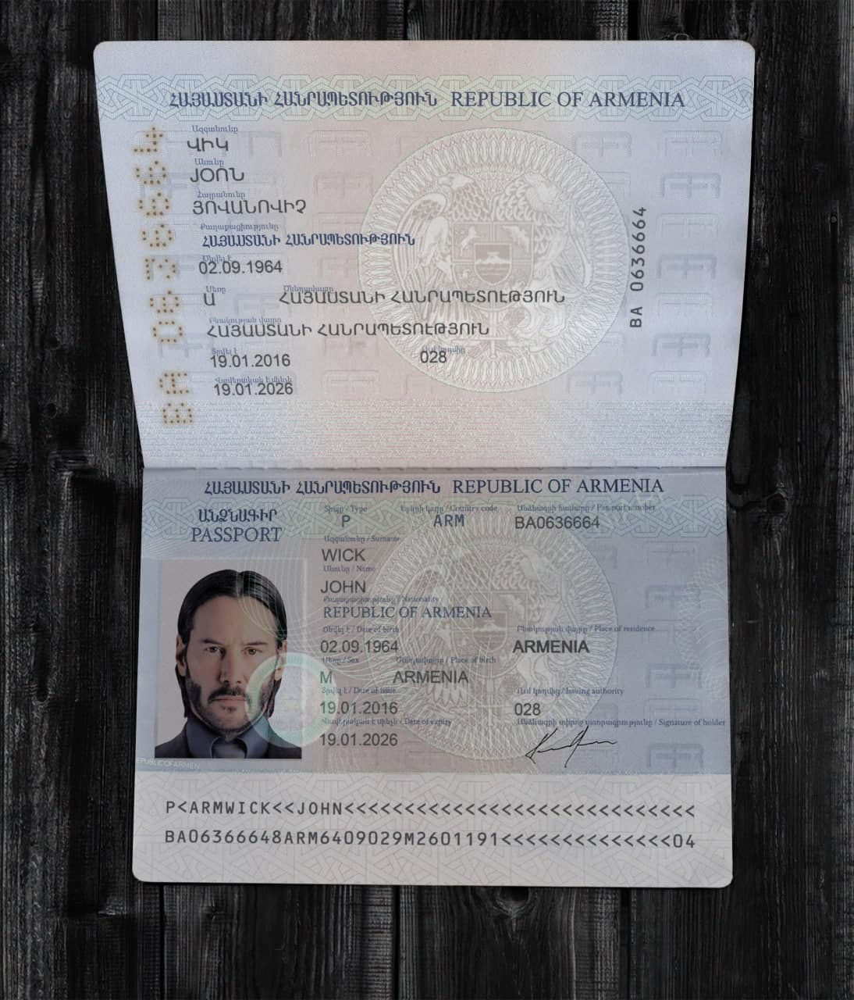

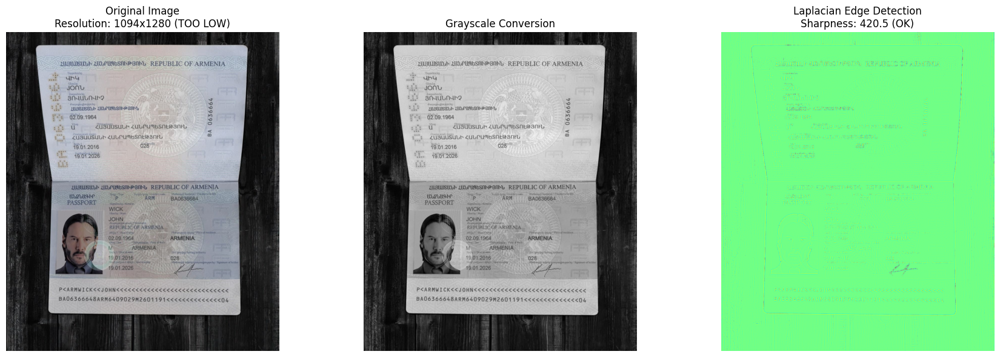


Final Result: FAIL: Resolution too low (got 1094x1280, need 2000x1400+)

Testing image: passport_images\Armenia Passport-1.jpg


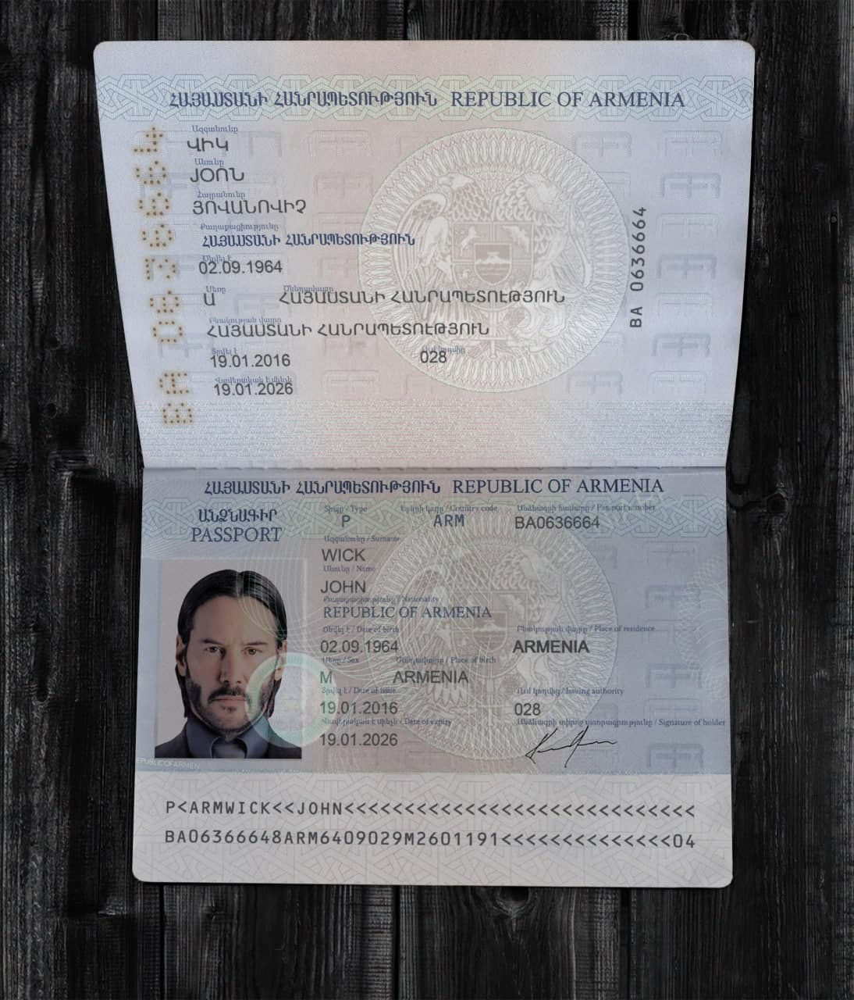

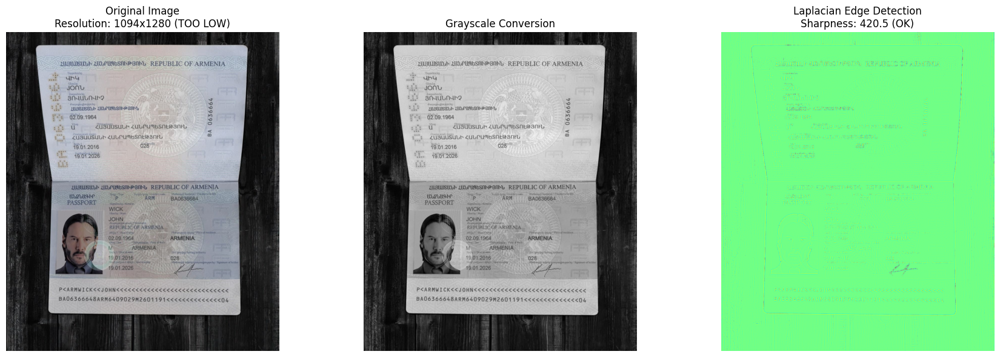


Final Result: FAIL: Resolution too low (got 1094x1280, need 2000x1400+)

Testing image: passport_images\Armenia Passport-1.jpg


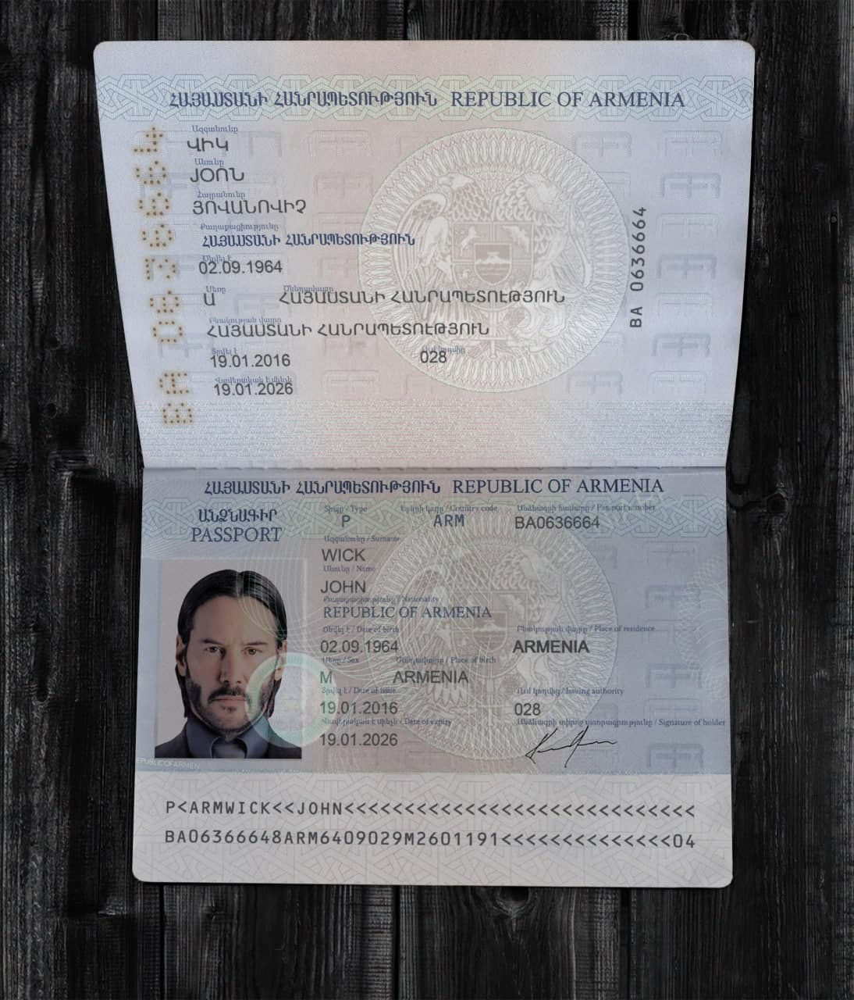

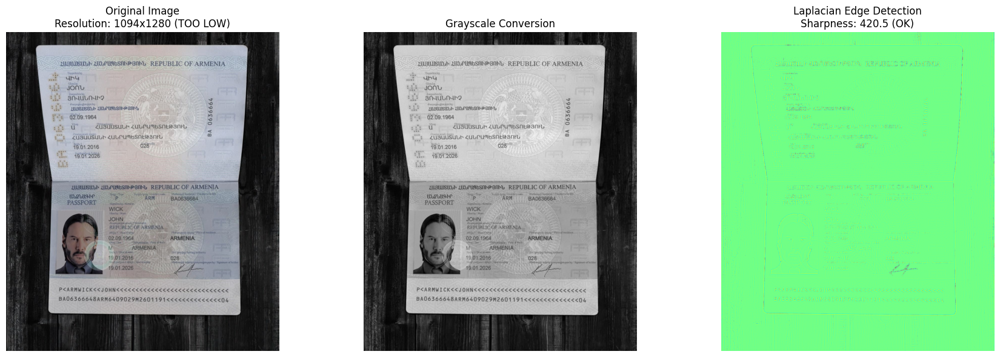


Final Result: FAIL: Resolution too low (got 1094x1280, need 2000x1400+)


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Image

def check_image_quality(image: np.ndarray, visualize: bool = True) -> tuple[bool, str]:
    """Enhanced version with visualization"""
    # 1. Get image dimensions
    height, width = image.shape[:2]
    
    # 2. Resolution check
    resolution_ok = width >= 2000 and height >= 1400
    resolution_msg = f"Resolution: {width}x{height} ({'OK' if resolution_ok else 'TOO LOW'})"
    
    # 3. Sharpness analysis
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    sharpness = laplacian.var()
    sharpness_ok = sharpness >= 100
    sharpness_msg = f"Sharpness: {sharpness:.1f} ({'OK' if sharpness_ok else 'BLURRY'})"
    
    # Visualization
    if visualize:
        fig, ax = plt.subplots(1, 3, figsize=(18, 6))
        
        # Original image
        ax[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax[0].set_title(f"Original Image\n{resolution_msg}")
        ax[0].axis('off')
        
        # Grayscale with edges
        ax[1].imshow(gray, cmap='gray')
        ax[1].set_title("Grayscale Conversion")
        ax[1].axis('off')
        
        # Laplacian edge map
        ax[2].imshow(laplacian, cmap='jet')
        ax[2].set_title(f"Laplacian Edge Detection\n{sharpness_msg}")
        ax[2].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    # Final verdict
    if not resolution_ok:
        return False, f"FAIL: Resolution too low (got {width}x{height}, need 2000x1400+)"
    if not sharpness_ok:
        return False, f"FAIL: Image too blurry (sharpness {sharpness:.1f} < 100)"
    
    return True, f"PASS: Good quality (Resolution: {width}x{height}, Sharpness: {sharpness:.1f})"

# Test with your own image
def test_with_image(image_path):
    print(f"\nTesting image: {image_path}")
    img = cv2.imread(image_path)
    
    if img is None:
        print("Error: Could not read image")
        return
    
    # Display original image thumbnail
    display(Image(filename=image_path, width=300))
    
    # Run quality check
    result, message = check_image_quality(img)
    print("\nFinal Result:", message)
    print("="*50)

# Example test cases (replace with your paths)
test_with_image("passport_images\Armenia Passport-1.jpg")  # High quality scan
test_with_image("passport_images\Armenia Passport-1.jpg")  # Low quality image
test_with_image("passport_images\Armenia Passport-1.jpg")  # Small resolution image

=== Using OpenCV ===
Resolution: 1094 x 1280 pixels

=== Using PIL ===
Resolution: 1094 x 1280 pixels
Format: JPEG
Mode: RGB

Calculated DPI: 312.6 (w) x 512.0 (h)


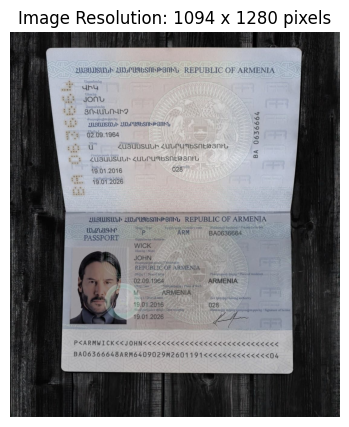

In [7]:
import cv2
from PIL import Image
import matplotlib.pyplot as plt

def get_image_resolution(image_path, physical_width_inch=None, physical_height_inch=None):
    """
    Get image resolution and optional DPI calculation
    
    Args:
        image_path: Path to image file
        physical_width_inch: Physical width in inches (optional)
        physical_height_inch: Physical height in inches (optional)
    """
    # Using OpenCV
    img_cv = cv2.imread(image_path)
    if img_cv is None:
        raise ValueError("Could not read image")
    
    height, width = img_cv.shape[:2]
    
    print("=== Using OpenCV ===")
    print(f"Resolution: {width} x {height} pixels")
    
    # Using PIL for additional metadata
    img_pil = Image.open(image_path)
    print("\n=== Using PIL ===")
    print(f"Resolution: {img_pil.width} x {img_pil.height} pixels")
    print(f"Format: {img_pil.format}")
    print(f"Mode: {img_pil.mode}")
    
    # DPI calculation if physical size provided
    if physical_width_inch and physical_height_inch:
        dpi_width = width / physical_width_inch
        dpi_height = height / physical_height_inch
        print(f"\nCalculated DPI: {dpi_width:.1f} (w) x {dpi_height:.1f} (h)")
    
    # Display the image
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB))
    plt.title(f"Image Resolution: {width} x {height} pixels")
    plt.axis('off')
    plt.show()

# Example usage
image_path = "passport_images\Armenia Passport-1.jpg"  # Replace with your image path
get_image_resolution(image_path, 
                    physical_width_inch=3.5,  # Example: passport width in inches
                    physical_height_inch=2.5)  # Example: passport height in inches

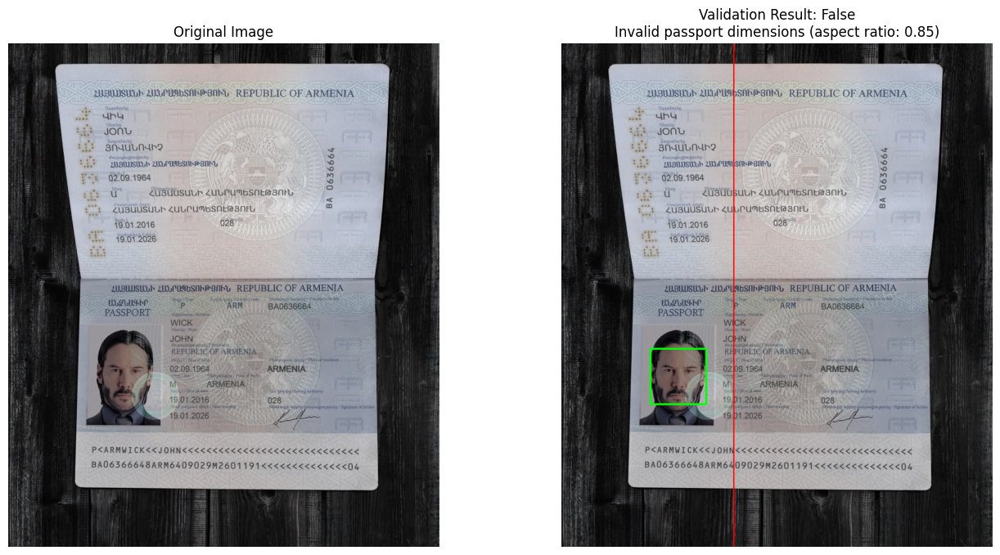

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

# Pre-crop the image to passport edges first using:
def auto_crop_passport(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest = max(contours, key=cv2.contourArea)
    x,y,w,h = cv2.boundingRect(largest)
    return image[y:y+h, x:x+w]

def check_passport_layout(image: np.ndarray) -> tuple[bool, str]:
    """Verify basic passport layout structure."""
    height, width = image.shape[:2]
    aspect_ratio = width / height
    
    # Check passport aspect ratio (typical range: 1.3-1.5)
    if not (1.3 <= aspect_ratio <= 1.5):
        return False, f"Invalid passport dimensions (aspect ratio: {aspect_ratio:.2f})"
    
    # Face detection (should be on right side for most passports)
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
    
    if len(faces) == 0:
        return False, "No face detected in passport photo"
    
    x, y, w, h = faces[0]
    if x < width * 0.6:  # Face should be on right side
        return False, "Face position incorrect (should be on right side)"
    
    return True, "Basic layout OK"

def test_passport_layout(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading image")
        return
    
    # Auto-crop passport first (recommended)
    cropped = auto_crop_passport(img)
    
    # Run validation
    is_valid, message = check_passport_layout(cropped)
    
    # Visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # Original image
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title("Original Image")
    ax1.axis('off')
    
    # Analysis visualization
    display_img = cropped.copy()
    height, width = cropped.shape[:2]
    
    # Draw face detection and guidelines
    gray = cv2.cvtColor(cropped, cv2.COLOR_BGR2GRAY)
    faces = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml').detectMultiScale(gray, 1.1, 5)
    
    for (x, y, w, h) in faces:
        cv2.rectangle(display_img, (x,y), (x+w,y+h), (0,255,0), 3)
    
    # Add position guideline (40% line)
    cv2.line(display_img, (int(width*0.4), 0), (int(width*0.4), height), (0,0,255), 2)
    
    ax2.imshow(cv2.cvtColor(display_img, cv2.COLOR_BGR2RGB))
    ax2.set_title(f"Validation Result: {is_valid}\n{message}")
    ax2.axis('off')
    
    plt.show()
# Test with your image
test_passport_layout("passport_images\Armenia Passport-1.jpg")  # Replace with your image path

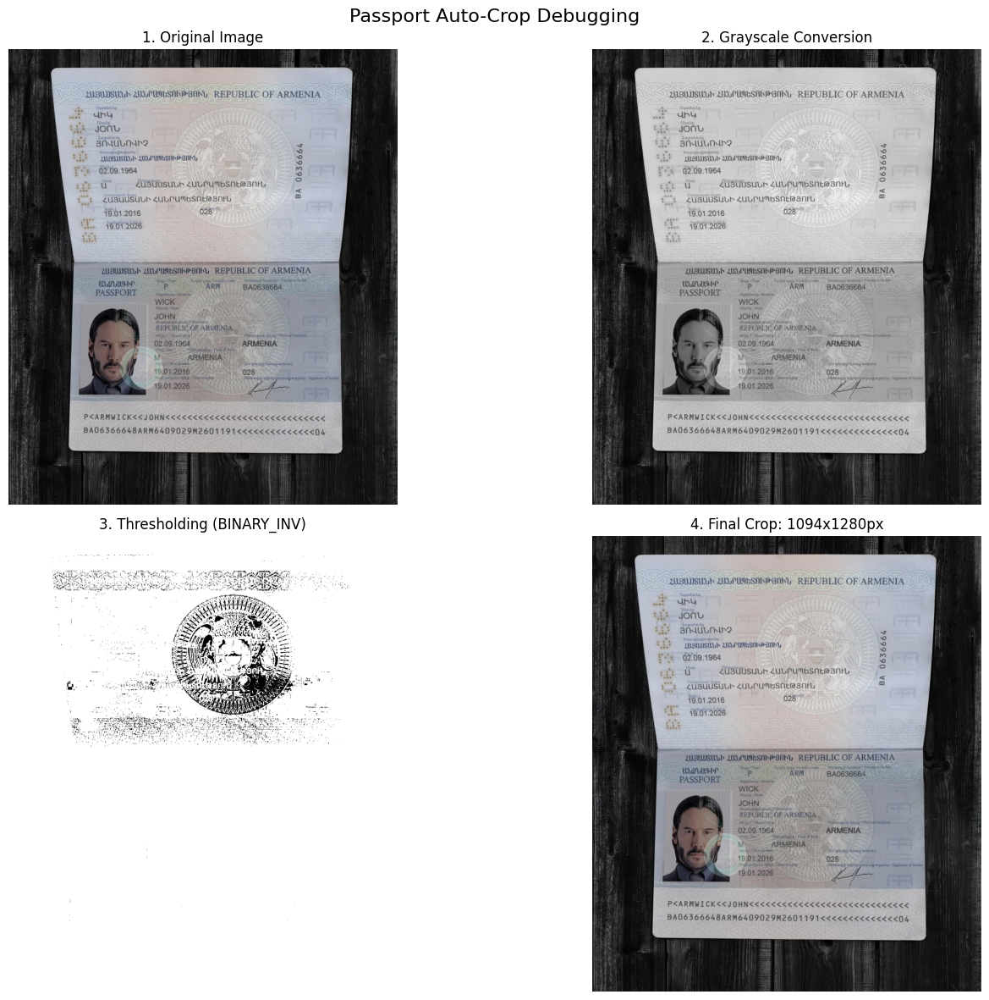


        ### Processing Results
        - **Total contours found**: 1
        - **Largest contour area**: 1,397,947.0 px²
        - **Bounding box**: (0, 0) to (1094, 1280)
        - **Cropped dimensions**: 1094 x 1280 pixels
        

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

def auto_crop_passport(image):
    """Original function to test"""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest = max(contours, key=cv2.contourArea)
    x,y,w,h = cv2.boundingRect(largest)
    return image[y:y+h, x:x+w]

def test_auto_crop(image_path):
    """Test function with visual debugging"""
    # Load image
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Could not read image")
        return
    
    # Convert to RGB for display
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # Create processing steps visualization
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    plt.suptitle("Passport Auto-Crop Debugging", fontsize=16)
    
    # 1. Show original image
    axes[0,0].imshow(img_rgb)
    axes[0,0].set_title("1. Original Image")
    axes[0,0].axis('off')
    
    # 2. Show grayscale conversion
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    axes[0,1].imshow(gray, cmap='gray')
    axes[0,1].set_title("2. Grayscale Conversion")
    axes[0,1].axis('off')
    
    # 3. Show thresholding result
    _, thresh = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY_INV)
    axes[1,0].imshow(thresh, cmap='gray')
    axes[1,0].set_title("3. Thresholding (BINARY_INV)")
    axes[1,0].axis('off')
    
    # 4. Show contour detection and final crop
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contour_img = img_rgb.copy()
    
    # Draw all contours in blue
    cv2.drawContours(contour_img, contours, -1, (0, 0, 255), 3)
    
    # Highlight largest contour in green
    if contours:
        largest = max(contours, key=cv2.contourArea)
        x,y,w,h = cv2.boundingRect(largest)
        cv2.rectangle(contour_img, (x,y), (x+w,y+h), (0, 255, 0), 5)
        
        # Show cropped result
        cropped = img_rgb[y:y+h, x:x+w]
        axes[1,1].imshow(cropped)
        axes[1,1].set_title(f"4. Final Crop: {w}x{h}px")
    else:
        axes[1,1].imshow(contour_img)
        axes[1,1].set_title("4. No contours found!")
    
    axes[1,1].axis('off')
    plt.tight_layout()
    plt.show()
    
    # Print numerical results
    if contours:
        display(Markdown(f"""
        ### Processing Results
        - **Total contours found**: {len(contours)}
        - **Largest contour area**: {cv2.contourArea(largest):,} px²
        - **Bounding box**: ({x}, {y}) to ({x+w}, {y+h})
        - **Cropped dimensions**: {w} x {h} pixels
        """))
    else:
        print("Error: No contours detected - adjust thresholding")

# Example usage
test_image_path = "passport_images\Armenia Passport-1.jpg"  # Replace with your image path
test_auto_crop(test_image_path)

# Additional test cases (uncomment to test)
# test_auto_crop("passport_with_background.jpg")
# test_auto_crop("blurry_passport.jpg")
# test_auto_crop("multiple_documents.jpg")

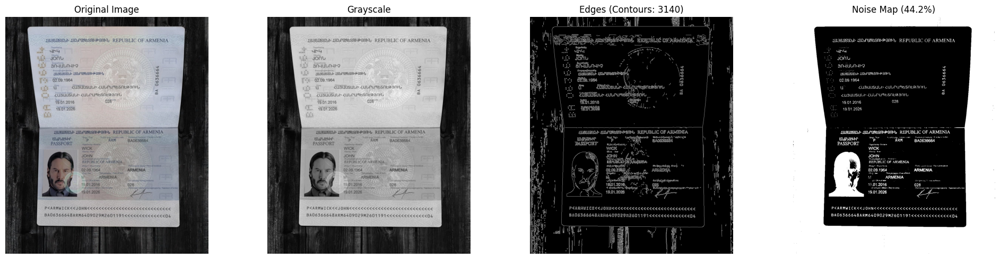


    ## Tampering Detection Report
    - **Image**: `passport_images\Armenia Passport-1.jpg`
    - **Verdict**: ✅ GENUINE
    - **Details**: No obvious tampering detected
    


Technical Details:
- Edge count: 3140
- Noise ratio: 0.442
- Image dimensions: 1094x1280


In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Markdown

def detect_tampering(image: np.ndarray, visualize: bool = False) -> tuple[bool, str]:
    """Enhanced version with visualization option"""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Edge detection analysis
    edges = cv2.Canny(gray, 100, 200)
    contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    # Noise analysis
    _, binary = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY_INV)
    noise_ratio = cv2.countNonZero(binary) / gray.size
    
    # Visualization
    if visualize:
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        # Original image
        axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        axes[0].set_title("Original Image")
        axes[0].axis('off')
        
        # Grayscale
        axes[1].imshow(gray, cmap='gray')
        axes[1].set_title("Grayscale")
        axes[1].axis('off')
        
        # Edge detection
        axes[2].imshow(edges, cmap='gray')
        axes[2].set_title(f"Edges (Contours: {len(contours)})")
        axes[2].axis('off')
        
        # Noise analysis
        axes[3].imshow(binary, cmap='gray')
        axes[3].set_title(f"Noise Map ({noise_ratio*100:.1f}%)")
        axes[3].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    # Decision logic
    if len(contours) < 10:
        return True, f"Suspiciously few edges ({len(contours)}) detected"
    if noise_ratio > 0.5:
        return True, f"High noise level ({noise_ratio*100:.1f}%) detected"
    return False, "No obvious tampering detected"

def test_tampering_detection(image_path):
    """Test function with detailed report"""
    img = cv2.imread(image_path)
    if img is None:
        print("Error loading image")
        return
    
    # Run detection
    is_tampered, message = detect_tampering(img, visualize=True)
    
    # Display results
    display(Markdown(f"""
    ## Tampering Detection Report
    - **Image**: `{image_path}`
    - **Verdict**: {'⚠️ TAMPERED' if is_tampered else '✅ GENUINE'}
    - **Details**: {message}
    """))
    
    # Print numerical values
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 100, 200)
    contours, _ = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    _, binary = cv2.threshold(gray, 120, 255, cv2.THRESH_BINARY_INV)
    noise_ratio = cv2.countNonZero(binary) / gray.size
    
    print(f"\nTechnical Details:")
    print(f"- Edge count: {len(contours)}")
    print(f"- Noise ratio: {noise_ratio:.3f}")
    print(f"- Image dimensions: {img.shape[1]}x{img.shape[0]}")

# Test cases (replace with your images)
test_images = [
    "passport_images\Armenia Passport-1.jpg"    # Printed fake
]

for img_path in test_images:
    try:
        test_tampering_detection(img_path)
    except Exception as e:
        print(f"Error processing {img_path}: {str(e)}")

In [ ]:
def detect_tampering(image: np.ndarray) -> tuple[bool, str]:
    """
    Optimized for mobile passport photos with these common characteristics:
    - Variable lighting conditions
    - Mild motion blur
    - Possible glare spots
    - Moderate compression artifacts
    """
    # Convert to grayscale with contrast enhancement
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)  # Compensate for poor lighting
    
    # Adaptive edge detection (better for mobile quality)
    edges = cv2.Canny(gray, 80, 160)  # Lower thresholds for mobile blur
    if int(cv2.__version__.split('.')[0]) >= 4:
        contours, hierarchy = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    else:
        _, contours, hierarchy = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    
    # Dynamic contour threshold based on image size
    min_contours = max(5, int(image.shape[0] * image.shape[1] / 50000))  # 5-15 for typical mobile shots
    
    if len(contours) < min_contours:
        return True, f"Suspiciously few edges ({len(contours)} < {min_contours})"
    
    # Smart noise analysis with mobile-specific thresholds
    _, binary = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                    cv2.THRESH_BINARY_INV, 11, 2)
    noise_ratio = cv2.countNonZero(binary) / gray.size
    
    # Mobile-specific noise thresholds
    if noise_ratio > 0.65:  # Higher tolerance for mobile artifacts
        return True, f"Excessive noise ({noise_ratio*100:.1f}%)"
    if noise_ratio < 0.15:  # Too clean may indicate smoothing
        return True, f"Unnaturally low noise ({noise_ratio*100:.1f}%)"
    
    # Additional mobile-specific checks
    # 1. Glare detection
    _, bright_pixels = cv2.threshold(gray, 220, 255, cv2.THRESH_BINARY)
    if cv2.countNonZero(bright_pixels) > (gray.size * 0.1):  #>10% bright pixels
        return True, "Excessive glare detected"
    
    # 2. Compression artifact check
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    if laplacian_var < 50:  # Very blurry
        return True, f"Excessive blur (Laplacian: {laplacian_var:.1f})"
    
    return False, "No signs of tampering detected"


# Step 4: Tampering detection
        tampering_detected, tampering_msg = detect_tampering(image)
        if tampering_detected:
            return JSONResponse(
                status_code=400,
                content={"valid": False, "error": tampering_msg}
            )